In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from multiprocessing import Pool



In [2]:
print(np.__version__) # 1.26.4 used
print(pd.__version__) # 2.2.1 used
print(matplotlib.__version__) # 3.8.4 used
print(sns.__version__) # 0.13.2 used

1.26.4
2.2.1
3.8.4
0.13.2


# Load data

In [3]:
PATH_df = "/home/simon/Documents/scripts/VIEWS_FAO_index/data/raw_viewser/simon_full_base_01_viewser_df.pkl"
df = pd.read_pickle(PATH_df)
# validate_dataframe(df)

# Aggregate

In [4]:
def aggregate_monthly_to_yearly(df):
    """
    Aggregate monthly data to yearly level while keeping all columns intact.
    
    Parameters:
    df (pd.DataFrame): The data as a pandas DataFrame
    
    Returns:
    pd.DataFrame: Data aggregated at the yearly level
    """
    # columns to group by
    grouping_columns = ['pg_id', 'year_id']

    # Columns that are monthly and need to be summed
    monthly_columns = ['sb_best', 'ns_best', 'os_best']  # Add more columns if needed
    
    # Group by 'pg_id' and 'year_id', summing the monthly columns
    df_yearly_summed = df.groupby(grouping_columns)[monthly_columns].sum().reset_index()
    
    # Identify yearly columns by excluding the monthly columns and grouping columns
    yearly_columns = [col for col in df.columns if col not in monthly_columns + grouping_columns]

    # Get the first occurrence of the yearly columns since they don't change
    df_yearly_intact = df.groupby(grouping_columns)[yearly_columns].first().reset_index()
    
    # Merge the summed monthly data with the yearly data
    df_yearly = pd.merge(df_yearly_summed, df_yearly_intact, on=['pg_id', 'year_id'])

    # drop the 'month_id' column
    df_yearly.drop('month_id', axis=1, inplace=True)
    
    return df_yearly

In [5]:
# Aggregate the data to yearly level
df_yearly = aggregate_monthly_to_yearly(df)

# Starting with monthly

In [6]:
def feature_eng_fat_per_100k(df):
    """
    Perform feature engineering to calculate fatalities per 100,000 population.

    Parameters:
    df (pd.DataFrame): Input DataFrame containing conflict data.

    Returns:
    pd.DataFrame: Modified DataFrame with new features.
    """
    # Feature engineering

    # Totally best (fatalities)
    df['total_best'] = df['sb_best'] + df['ns_best'] + df['os_best']

    # Population normalization counts
    n_pop = 100000

    # Replace zero population values with NaN using the recommended method
    df.replace({'pop_gpw_sum': {0: np.nan}}, inplace=True)

    # Fatalities per 100,000 population for each type of conflict
    df['fatalities_per_100k'] = (df['total_best'] / df['pop_gpw_sum']) * n_pop
    df['sb_per_100k'] = (df['sb_best'] / df['pop_gpw_sum']) * n_pop
    df['ns_per_100k'] = (df['ns_best'] / df['pop_gpw_sum']) * n_pop
    df['os_per_100k'] = (df['os_best'] / df['pop_gpw_sum']) * n_pop

    # Fill NaNs with 0 - NaN values are created when dividing by 0 population, so it makes sense to fill them with 0
    df.fillna(0, inplace=True)

    # Test that all the new columns are created and have valid values:

    # Check for the existence of the new columns
    new_columns = ['fatalities_per_100k', 'sb_per_100k', 'ns_per_100k', 'os_per_100k']
    for col in new_columns:
        assert col in df.columns, f"Column {col} is missing from the DataFrame"

    # Check for the correct data types
    for col in new_columns:
        assert np.issubdtype(df[col].dtype, np.number), f"Column {col} does not have a numeric data type"

    # Check for the correct number of rows
    assert len(df) == len(df.dropna()), "The number of rows in the DataFrame has changed"

    # Above 0
    assert df['fatalities_per_100k'].min() >= 0
    assert df['sb_per_100k'].min() >= 0
    assert df['ns_per_100k'].min() >= 0
    assert df['os_per_100k'].min() >= 0

    # Not NaN, Inf or -Inf
    assert not df['fatalities_per_100k'].isnull().values.any()
    assert not df['sb_per_100k'].isnull().values.any()
    assert not df['ns_per_100k'].isnull().values.any()
    assert not df['os_per_100k'].isnull().values.any()

    assert not np.isinf(df['fatalities_per_100k']).values.any()
    assert not np.isinf(df['sb_per_100k']).values.any()
    assert not np.isinf(df['ns_per_100k']).values.any()
    assert not np.isinf(df['os_per_100k']).values.any()

    assert not np.isneginf(df['fatalities_per_100k']).values.any()
    assert not np.isneginf(df['sb_per_100k']).values.any()
    assert not np.isneginf(df['ns_per_100k']).values.any()
    assert not np.isneginf(df['os_per_100k']).values.any()

    return df

In [7]:
def calculate_cumulative_distribution(df, value_col):
    """
    Calculate the cumulative distribution of values across all voxels.

    Parameters:
    df (pd.DataFrame): The dataframe containing voxel data.
    value_col (str): The name of the column containing voxel values.

    Returns:
    pd.Series: A series representing the cumulative distribution.

    Raises:
    ValueError: If the DataFrame is empty.
    KeyError: If the specified column does not exist in the DataFrame.
    TypeError: If the specified column does not contain numeric values.
    """
    # Check if the DataFrame is empty
    if df.empty:
        raise ValueError("The input DataFrame is empty.")
    
    # Check if the column exists in the DataFrame
    if value_col not in df.columns:
        raise KeyError(f"The column '{value_col}' does not exist in the DataFrame.")
    
    # Check if the column contains numeric values
    if not np.issubdtype(df[value_col].dtype, np.number):
        raise TypeError(f"The column '{value_col}' does not contain numeric values.")
    
    # Calculate the frequency of each unique value
    value_counts = df[value_col].value_counts().sort_index(ascending=False)
    
    # Compute the cumulative distribution
    cumulative_distribution = value_counts.cumsum()
    
    # Check if the cumulative distribution is correctly calculated
    if cumulative_distribution.empty:
        raise ValueError("The cumulative distribution calculation resulted in an empty series.")
    
    return cumulative_distribution

In [8]:
def calculate_global_probabilities(df, value_col, time_col):
    """
    Calculate probabilities p_i and P_i for each unique value in the dataset and map them to the original DataFrame.

    Parameters:
    df (pd.DataFrame): The dataframe containing voxel data.
    value_col (str): The name of the column containing voxel values.
    time_col (str): The name of the column representing time units.
    stat_measure (str): The statistical measure to use for num_units_per_time_unit ('mean', 'median', 'mode').

    Returns:
    pd.DataFrame: The original dataframe with added columns for unit_likelihood and time_unit_likelihood.
    """
    # Check if the DataFrame is empty
    if df.empty:
        raise ValueError("The input DataFrame is empty.")
    
    # Check if the specified columns exist in the DataFrame
    if value_col not in df.columns:
        raise ValueError(f"The specified value column '{value_col}' does not exist in the DataFrame.")
    if time_col not in df.columns:
        raise ValueError(f"The specified time column '{time_col}' does not exist in the DataFrame.")
    
    # Calculate cumulative distribution
    try:
        cumulative_distribution = calculate_cumulative_distribution(df, value_col)
        
    except Exception as e:
        raise RuntimeError(f"Error calculating cumulative distribution: {e}")
    
    # Calculate total number of units
    total_units = df.shape[0]
    
    # Calculate the number of units per time unit
    num_units_per_time_unit = df.groupby(time_col).size().mean() # same as just taking one month

    # Calculate p_i (unit likelihood)
    p_i = cumulative_distribution / total_units
    
    # Calculate P_i (time unit likelihood)
    P_i = 1 - (1 - p_i)**num_units_per_time_unit
    
    # Create a DataFrame with values, p_i, and P_i
    probabilities_df = pd.DataFrame({
        value_col: cumulative_distribution.index,
        f'{value_col}_unit_likelihood': p_i.values,
        f'{value_col}_time_unit_likelihood': P_i.values
    })
    
    # Merge the probabilities_df with the original df on the value_col
    df = df.merge(probabilities_df, left_on=value_col, right_on=value_col, how='left')
    
    return df

In [9]:
def calculate_country_probabilities_per_country(country_df: pd.DataFrame, value_col: str, time_col: str) -> pd.DataFrame:
    """
    Calculate the probabilities p_i and P_i for each unique value in the dataset for a given country.

    Parameters:
    - country_df (pd.DataFrame): DataFrame containing data for a single country.
    - value_col (str): The column name for the voxel values.
    - time_col (str): The column name for the time periods.

    Returns:
    - pd.DataFrame: DataFrame with added columns for p_i and P_i probabilities.
    """
    # Calculate cumulative distribution
    cumulative_distribution = country_df[value_col].rank(method='max') / len(country_df)
    
    # Calculate total number of voxels
    total_units = len(country_df)
    
    # Calculate number of units per time unit
    num_units_per_time_unit = country_df.groupby(time_col).size().mean()
    
    # Calculate p_i
    p_i = cumulative_distribution / total_units
    
    # Calculate P_i
    P_i = 1 - (1 - p_i)**num_units_per_time_unit
    
    # Ensure p_i and P_i for 0 are set to 1
    zero_mask = country_df[value_col] == 0
    p_i[zero_mask] = 1
    P_i[zero_mask] = 1
    
    # Add results to DataFrame
    country_df[f'{value_col}_unit_likelihood_country'] = p_i.values
    country_df[f'{value_col}_time_unit_likelihood_country'] = P_i.values
    
    return country_df

In [10]:
def calculate_all_country_probabilities(df: pd.DataFrame, value_col: str, time_col: str) -> pd.DataFrame:
    """
    Calculate the probabilities p_i and P_i for each unique value in the dataset for all countries.

    Parameters:
    - df (pd.DataFrame): DataFrame containing data for all countries.
    - value_col (str): The column name for the voxel values.
    - time_col (str): The column name for the time periods.
    - stat_measure (str): The statistical measure to use ('mean', 'median', 'mode').

    Returns:
    - pd.DataFrame: DataFrame with added columns for p_i and P_i probabilities for all countries.
    """
    if df.empty:
        raise ValueError("The input DataFrame is empty.")
    
    if value_col not in df.columns:
        raise ValueError(f"The specified value column '{value_col}' does not exist in the DataFrame.")
    
    if time_col not in df.columns:
        raise ValueError(f"The specified time column '{time_col}' does not exist in the DataFrame.")
    
    countries = df['c_id'].unique()
    
    with Pool() as pool:
        results = pool.starmap(
            calculate_country_probabilities_per_country, 
            [(df[df['c_id'] == country], value_col, time_col) for country in countries]
        )
    
    result_df = pd.concat(results, ignore_index=True)
    
    return result_df

In [11]:
def calculate_return_periods(df, p_i_col, P_i_col):
    """
    Calculate the expected number of time periods and voxels to survey to find at least one voxel with a value greater than or equal to i.

    Parameters:
    df (pd.DataFrame): Dataframe containing values, p_i, and P_i.
    p_i_col (str): The name of the column containing unit likelihoods (p_i).
    P_i_col (str): The name of the column containing time unit likelihoods (P_i).

    Returns:
    pd.DataFrame: The original dataframe with added columns for time unit return periods (E_i) and unit return periods (E_{i}^{voxels}).
    """
    # Infer value_col by removing the '_unit_likelihood' suffix from p_i_col
    value_col = p_i_col.replace("_unit_likelihood", "")

    # if the value_col ends on "_contry" we need to remove that as well
    if value_col.endswith("_country"):
        value_col = value_col.replace("_country", "")

    # Save it as a suffix for the new columns
        suffix = "_country"

    else:
        suffix = ""

    # Calculate E_i = 1 / P_i
    df[f'{value_col}_time_unit_return_period{suffix}'] = 1 / df[P_i_col]
    
    # Calculate E_{i}^{voxels} = 1 / p_i
    df[f'{value_col}_unit_return_period{suffix}'] = 1 / df[p_i_col]
    
    return df

# Now put it all toghter

In [12]:
def feature_engineering_pipeline(df):

    # Perform feature engineering to calculate fatalities per 100,000 population
    df = feature_eng_fat_per_100k(df)

    # now loop through the columns and calculate probabilities
    columns = ['sb_best', 'ns_best', 'os_best', 'total_best', 'fatalities_per_100k', 'sb_per_100k', 'ns_per_100k', 'os_per_100k']
    for col in columns:
        df = calculate_global_probabilities(df, col, 'year_id')
        df = calculate_all_country_probabilities(df, col, 'year_id')

    # now loop through the columns and calculate return periods
    for col in columns:
        df = calculate_return_periods(df, f'{col}_unit_likelihood', f'{col}_time_unit_likelihood')
        df = calculate_return_periods(df, f'{col}_unit_likelihood_country', f'{col}_time_unit_likelihood_country')

    # check that all the new expected columns are created
    new_columns = [
        'total_best', 'fatalities_per_100k', 'sb_per_100k', 'ns_per_100k', 'os_per_100k',
        'fatalities_per_100k_unit_likelihood', 'fatalities_per_100k_time_unit_likelihood',
        'sb_per_100k_unit_likelihood', 'sb_per_100k_time_unit_likelihood',
        'ns_per_100k_unit_likelihood', 'ns_per_100k_time_unit_likelihood',
        'os_per_100k_unit_likelihood', 'os_per_100k_time_unit_likelihood',
        'total_best_unit_likelihood', 'total_best_time_unit_likelihood',
        'fatalities_per_100k_unit_return_period', 'fatalities_per_100k_time_unit_return_period',
        'sb_per_100k_unit_return_period', 'sb_per_100k_time_unit_return_period',
        'ns_per_100k_unit_return_period', 'ns_per_100k_time_unit_return_period',
        'os_per_100k_unit_return_period', 'os_per_100k_time_unit_return_period',
        'total_best_unit_return_period', 'total_best_time_unit_return_period',
        'fatalities_per_100k_unit_likelihood_country', 'fatalities_per_100k_time_unit_likelihood_country',
        'sb_per_100k_unit_likelihood_country', 'sb_per_100k_time_unit_likelihood_country',
        'ns_per_100k_unit_likelihood_country', 'ns_per_100k_time_unit_likelihood_country',
        'os_per_100k_unit_likelihood_country', 'os_per_100k_time_unit_likelihood_country',
        'total_best_unit_likelihood_country', 'total_best_time_unit_likelihood_country',
        'fatalities_per_100k_unit_return_period_country', 'fatalities_per_100k_time_unit_return_period_country',
        'sb_per_100k_unit_return_period_country', 'sb_per_100k_time_unit_return_period_country',
        'ns_per_100k_unit_return_period_country', 'ns_per_100k_time_unit_return_period_country',
        'os_per_100k_unit_return_period_country', 'os_per_100k_time_unit_return_period_country',
        'total_best_unit_return_period_country', 'total_best_time_unit_return_period_country'
    ]
    
    for col in new_columns:
        assert col in df.columns, f"Column {col} is missing from the DataFrame"

    return df

In [13]:
df_yearly = feature_engineering_pipeline(df_yearly)

In [14]:
df_yearly

,pg_id,year_id,sb_best,ns_best,os_best,month,c_id,col,row,pop_gpw_sum,...,sb_per_100k_time_unit_return_period_country,sb_per_100k_unit_return_period_country,ns_per_100k_time_unit_return_period,ns_per_100k_unit_return_period,ns_per_100k_time_unit_return_period_country,ns_per_100k_unit_return_period_country,os_per_100k_time_unit_return_period,os_per_100k_unit_return_period,os_per_100k_time_unit_return_period_country,os_per_100k_unit_return_period_country
0,62356,1989,0.0,0.0,0.0,1,192,436,87,0.000000,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,62356,1990,0.0,0.0,0.0,1,192,436,87,0.000000,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,79599,1989,0.0,0.0,0.0,1,192,399,111,3890.091064,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,79599,1990,0.0,0.0,0.0,1,192,399,111,3890.091064,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,79600,1989,0.0,0.0,0.0,1,192,400,111,2452.416016,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
458845,190496,2019,0.0,0.0,0.0,1,89,416,265,33143.308594,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
458846,190496,2020,0.0,0.0,0.0,1,89,416,265,33143.308594,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
458847,190496,2021,0.0,0.0,0.0,1,89,416,265,33143.308594,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
458848,190496,2022,0.0,0.0,0.0,1,89,416,265,33143.308594,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


# Plotting:

In [15]:
def plot_time_series_data(df, time_ids, time_id_name, columns, figsize=(18, 25), cmap="rainbow", alpha=0.6, marker='.', s=6):
    """
    Plots a grid of scatter plots for specified time_ids and columns.

    Parameters:
    - df: pandas DataFrame containing the data
    - time_ids: list of time_ids to plot (e.g., months, years, weeks)
    - time_id_name: name of the time_id column (e.g 'month_id', 'year_id', 'week_id')
    - columns: list of columns to plot
    - figsize: tuple specifying the figure size
    - cmap: colormap for the scatter plots
    - alpha: transparency level of the markers
    - marker: marker style for the scatter plots
    - s: size of the markers
    """
    
    # Create a subplot grid
    fig, axes = plt.subplots(nrows=len(columns), ncols=len(time_ids), figsize=figsize)

    # Iterate over the rows and columns to create each subplot
    for i, col in enumerate(columns):

        # if the columns name includes "likelihood" we the reverse the colormap
        if "likelihood" in col:
            cmap_suffix = "_r"

        else:
            cmap_suffix = ""

        for j, time_id in enumerate(time_ids):
            ax = axes[i, j]
            filtered_df = df[df[time_id_name] == time_id]
            scatter = ax.scatter(filtered_df["col"], filtered_df["row"], c=filtered_df[col], cmap=f'{cmap}{cmap_suffix}', alpha=alpha, marker=marker, s=s)
            
            # Add a color bar if the value is a float
            if filtered_df[col].dtype == "float64":
                cbar = plt.colorbar(scatter, ax=ax)
                cbar.set_label(col)
            
            # Add labels and title
            ax.set_xlabel('Column')
            ax.set_ylabel('Row')
            ax.set_title(f'{col} for Time ID {time_id}')
            
            # Add grid
            ax.grid(True, linestyle='--', alpha=0.5)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

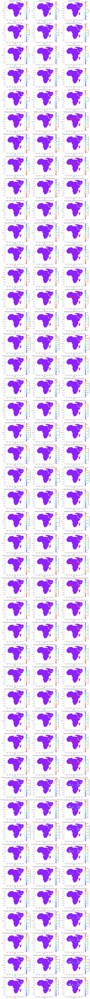

In [16]:
new_columns = [
        'total_best', 'fatalities_per_100k', 'sb_per_100k', 'ns_per_100k', 'os_per_100k',
        'fatalities_per_100k_unit_likelihood', 'fatalities_per_100k_time_unit_likelihood',
        'sb_per_100k_unit_likelihood', 'sb_per_100k_time_unit_likelihood',
        'ns_per_100k_unit_likelihood', 'ns_per_100k_time_unit_likelihood',
        'os_per_100k_unit_likelihood', 'os_per_100k_time_unit_likelihood',
        'total_best_unit_likelihood', 'total_best_time_unit_likelihood',
        'fatalities_per_100k_unit_return_period', 'fatalities_per_100k_time_unit_return_period',
        'sb_per_100k_unit_return_period', 'sb_per_100k_time_unit_return_period',
        'ns_per_100k_unit_return_period', 'ns_per_100k_time_unit_return_period',
        'os_per_100k_unit_return_period', 'os_per_100k_time_unit_return_period',
        'total_best_unit_return_period', 'total_best_time_unit_return_period',
        'fatalities_per_100k_unit_likelihood_country', 'fatalities_per_100k_time_unit_likelihood_country',
        'sb_per_100k_unit_likelihood_country', 'sb_per_100k_time_unit_likelihood_country',
        'ns_per_100k_unit_likelihood_country', 'ns_per_100k_time_unit_likelihood_country',
        'os_per_100k_unit_likelihood_country', 'os_per_100k_time_unit_likelihood_country',
        'total_best_unit_likelihood_country', 'total_best_time_unit_likelihood_country',
        'fatalities_per_100k_unit_return_period_country', 'fatalities_per_100k_time_unit_return_period_country',
        'sb_per_100k_unit_return_period_country', 'sb_per_100k_time_unit_return_period_country',
        'ns_per_100k_unit_return_period_country', 'ns_per_100k_time_unit_return_period_country',
        'os_per_100k_unit_return_period_country', 'os_per_100k_time_unit_return_period_country',
        'total_best_unit_return_period_country', 'total_best_time_unit_return_period_country']

#new_columns = ["sb_best", "ns_best", "os_best"]

time_ids = [1989, 1994, 2023]

plot_time_series_data(df_yearly, time_ids, "year_id", new_columns, figsize=(18, 200), cmap = "rainbow", alpha=0.6, marker='.', s=6)

In [17]:
# pickle the monthly df
df_yearly.to_pickle("/home/simon/Documents/scripts/VIEWS_FAO_index/data/processed/simon_full_base_01_viewser_df_rp_yearly.pkl")

In [18]:
df_yearly.columns

Index(['pg_id', 'year_id', 'sb_best', 'ns_best', 'os_best', 'month', 'c_id',
       'col', 'row', 'pop_gpw_sum', 'total_best', 'fatalities_per_100k',
       'sb_per_100k', 'ns_per_100k', 'os_per_100k', 'sb_best_unit_likelihood',
       'sb_best_time_unit_likelihood', 'sb_best_unit_likelihood_country',
       'sb_best_time_unit_likelihood_country', 'ns_best_unit_likelihood',
       'ns_best_time_unit_likelihood', 'ns_best_unit_likelihood_country',
       'ns_best_time_unit_likelihood_country', 'os_best_unit_likelihood',
       'os_best_time_unit_likelihood', 'os_best_unit_likelihood_country',
       'os_best_time_unit_likelihood_country', 'total_best_unit_likelihood',
       'total_best_time_unit_likelihood', 'total_best_unit_likelihood_country',
       'total_best_time_unit_likelihood_country',
       'fatalities_per_100k_unit_likelihood',
       'fatalities_per_100k_time_unit_likelihood',
       'fatalities_per_100k_unit_likelihood_country',
       'fatalities_per_100k_time_unit_likel

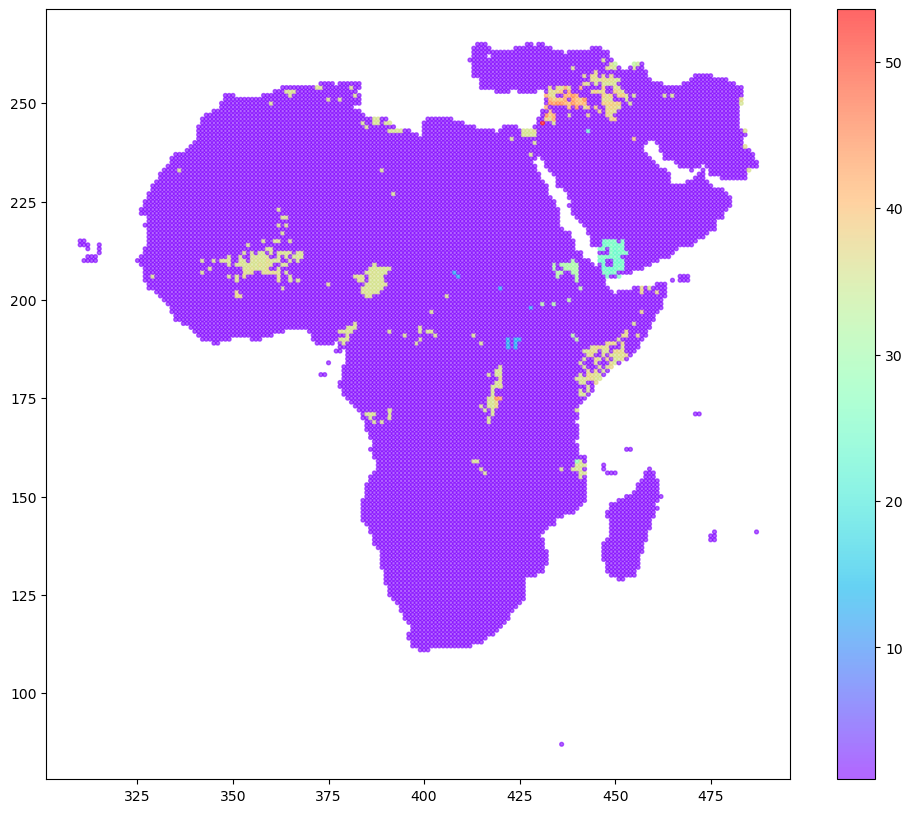

In [19]:
# get a subset of our year 318
df_318 = df_yearly[df_yearly["year_id"] == 2020]

# change the size of the plot
plt.figure(figsize=(12, 10))

# scatter with row and col and color by fatalities per 100k_return_period
plt.scatter(df_318["col"], df_318["row"], c=df_318["sb_best_time_unit_return_period_country"], cmap="rainbow", alpha=0.6, marker='.', s=30)

# colorbar
plt.colorbar()

plt.show()

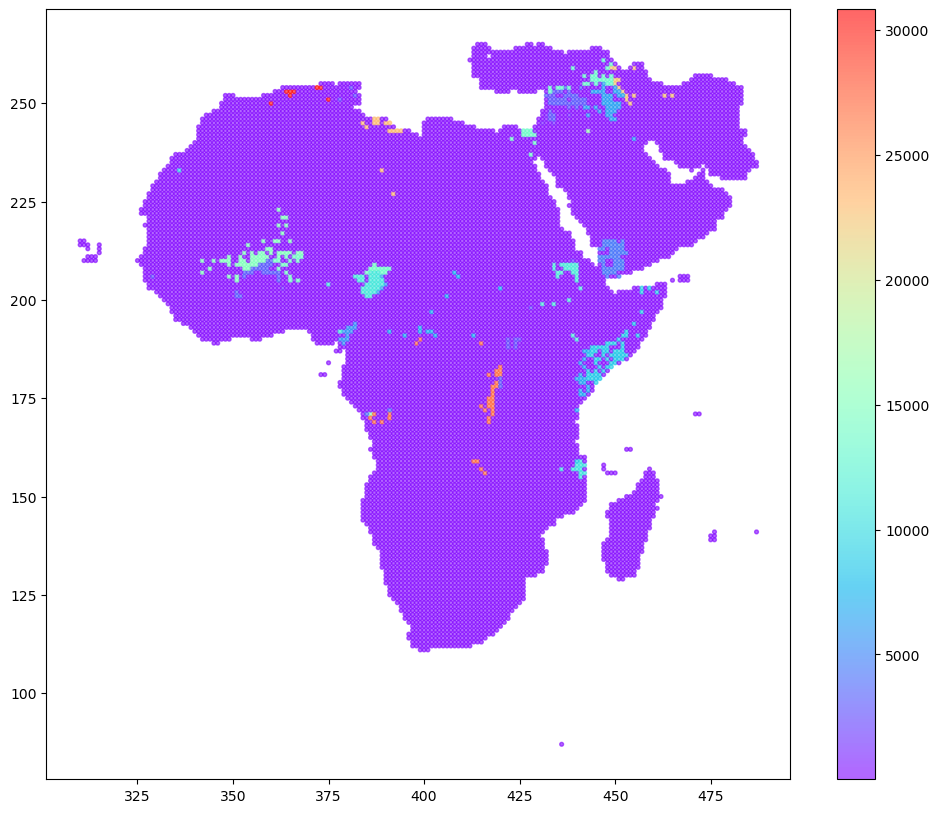

In [20]:
# get a subset of our year 318
df_318 = df_yearly[df_yearly["year_id"] == 2020]

# change the size of the plot
plt.figure(figsize=(12, 10))

# scatter with row and col and color by fatalities per 100k_return_period
plt.scatter(df_318["col"], df_318["row"], c=df_318["sb_best_unit_return_period_country"], cmap="rainbow", alpha=0.6, marker='.', s=30)

# colorbar
plt.colorbar()

plt.show()

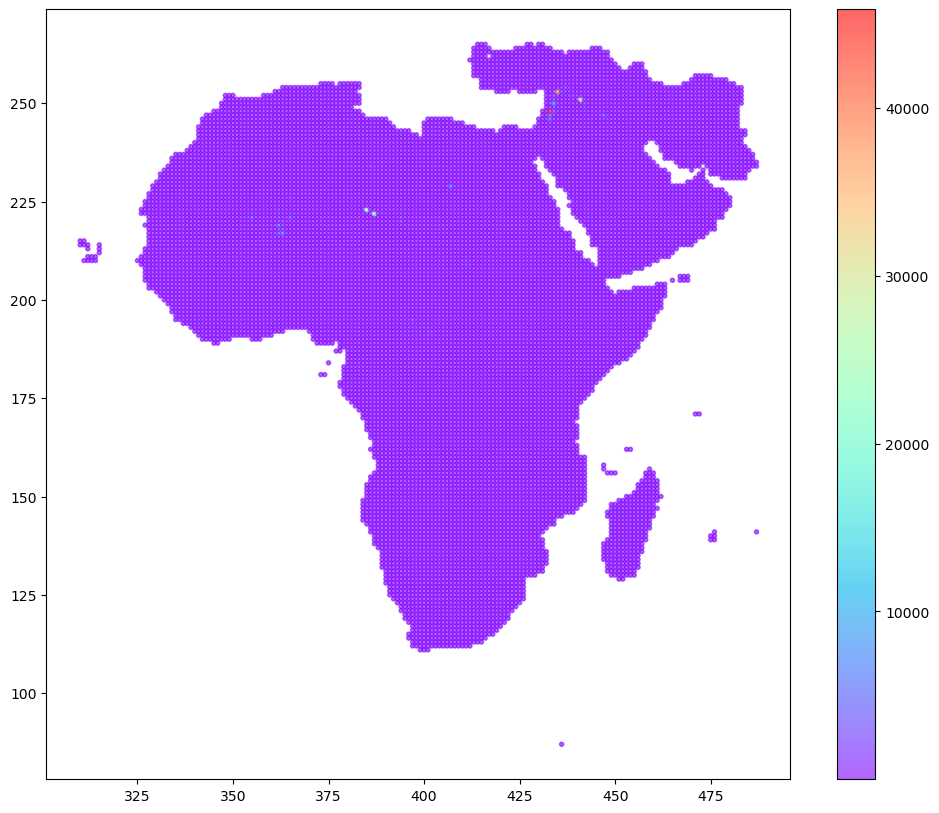

In [21]:
# get a subset of our year 318
df_318 = df_yearly[df_yearly["year_id"] == 2014]

# change the size of the plot
plt.figure(figsize=(12, 10))

# scatter with row and col and color by fatalities per 100k_return_period
plt.scatter(df_318["col"], df_318["row"], c=df_318["fatalities_per_100k_unit_return_period"], cmap="rainbow", alpha=0.6, marker='.', s=35)

# colorbar
plt.colorbar()

plt.show()

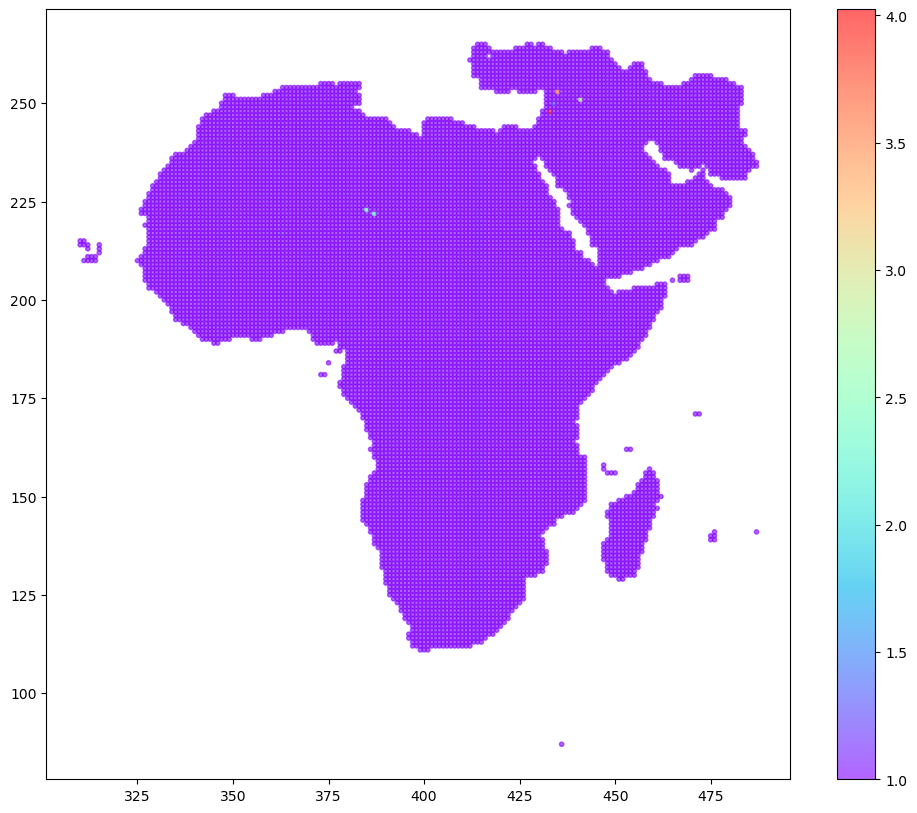

In [22]:
# get a subset of our year 318
df_318 = df_yearly[df_yearly["year_id"] == 2014]

# change the size of the plot
plt.figure(figsize=(12, 10))

# scatter with row and col and color by fatalities per 100k_return_period
plt.scatter(df_318["col"], df_318["row"], c=df_318["fatalities_per_100k_time_unit_return_period"], cmap="rainbow", alpha=0.6, marker='.', s=38)

# colorbar
plt.colorbar()

plt.show()

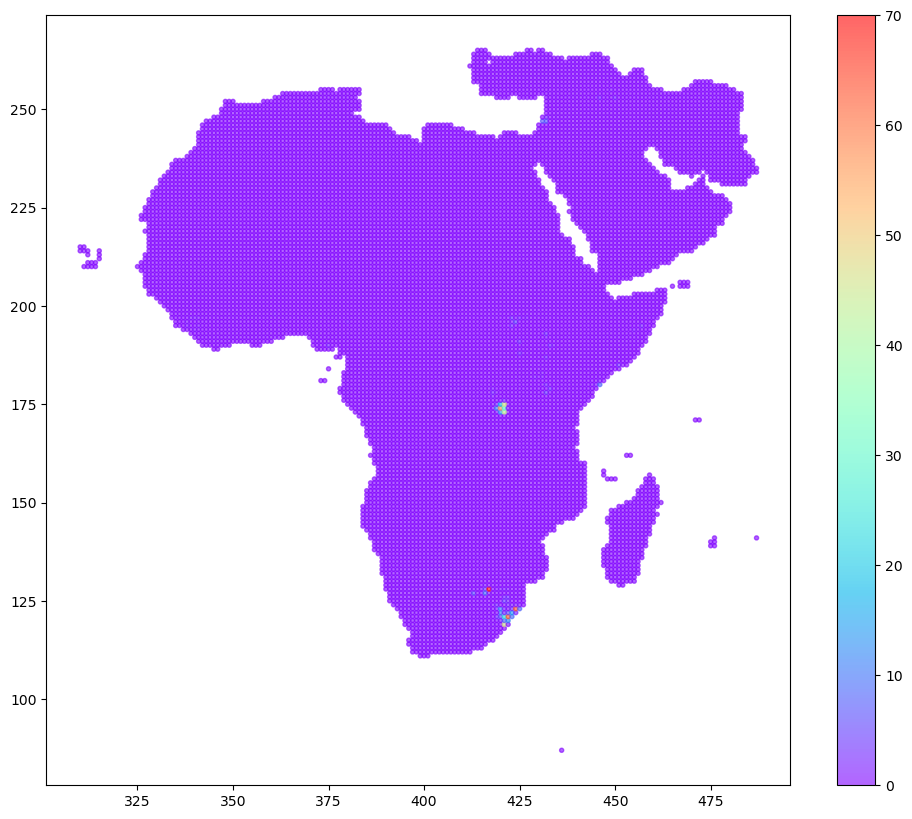

In [23]:
# get a subset of our year 318
df_318 = df_yearly[df_yearly["year_id"] == 1993]

# change the size of the plot
plt.figure(figsize=(12, 10))

# scatter with row and col and color by fatalities per 100k_return_period
plt.scatter(df_318["col"], df_318["row"], c=df_318["ns_best"], cmap="rainbow", alpha=0.6, marker='.', s=35)

# colorbar
plt.colorbar()

plt.show()